In [2]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
import random

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
import pathlib
import matplotlib.pyplot as plt

from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.optimizers import SGD
from tensorflow.keras.layers import BatchNormalization
from keras.layers import LeakyReLU

In [3]:
data_dir = pathlib.Path("test_images/")
data_dir

WindowsPath('test_images')

In [4]:
image_count = len(list(data_dir.glob('*/*.jpg')))
image_count

2038

340


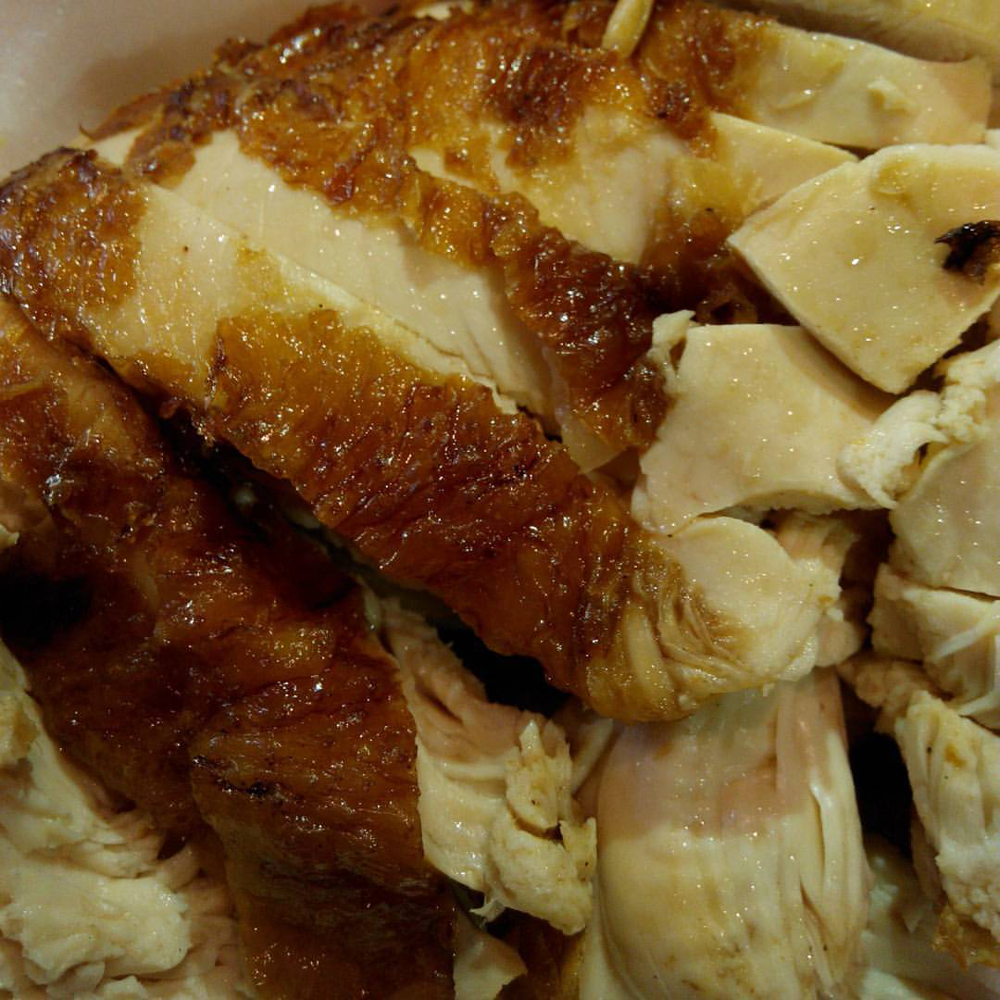

In [5]:
roasted_imgs = list(data_dir.glob('Roasted Chicken Rice/*.jpg'))
print(len(roasted_imgs))
PIL.Image.open(roasted_imgs[5])

340


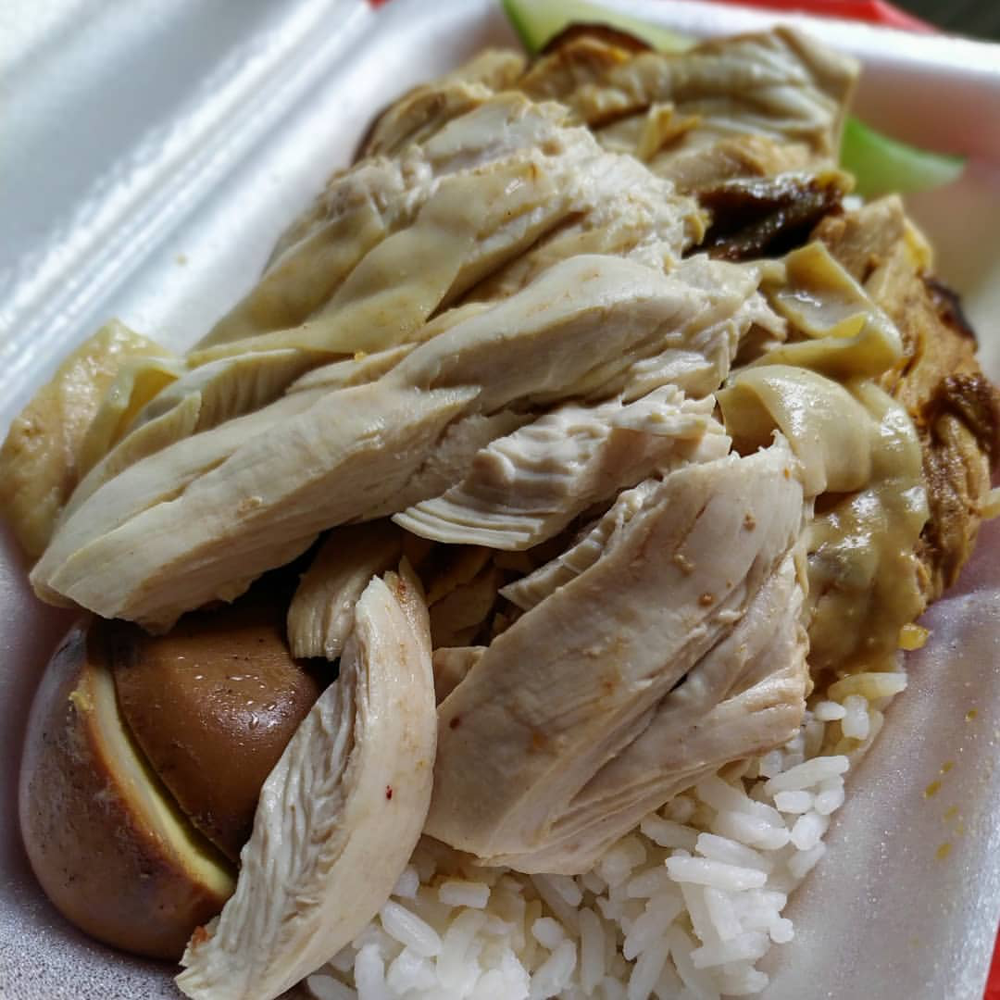

In [6]:
steamed_imgs = list(data_dir.glob('Steamed Chicken Rice/*.jpg'))
print(len(steamed_imgs))
PIL.Image.open(steamed_imgs[1])

319


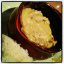

In [7]:
curry_imgs = list(data_dir.glob('Curry/*.jpg'))
print(len(curry_imgs))
PIL.Image.open(curry_imgs[1])

238


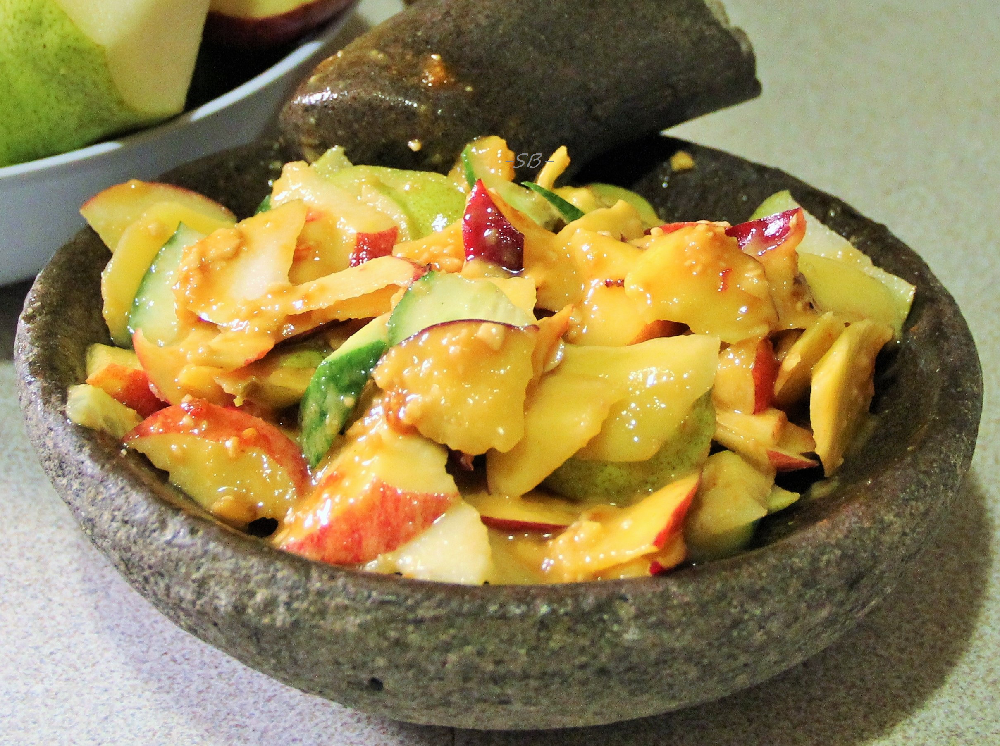

In [8]:
rojak_imgs = list(data_dir.glob('rojak/*.jpg'))
print(len(rojak_imgs))
PIL.Image.open(rojak_imgs[1])

300


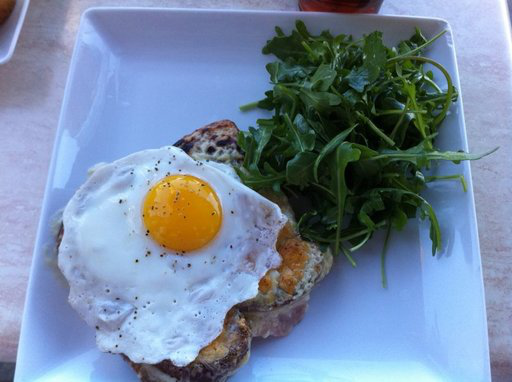

In [9]:
rojak_imgs = list(data_dir.glob('egg/*.jpg'))
print(len(rojak_imgs))
PIL.Image.open(rojak_imgs[1])

300


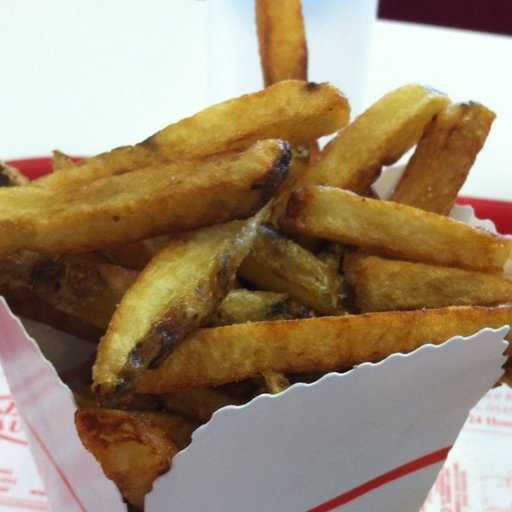

In [10]:
rojak_imgs = list(data_dir.glob('FrenchFries/*.jpg'))
print(len(rojak_imgs))
PIL.Image.open(rojak_imgs[1])

201


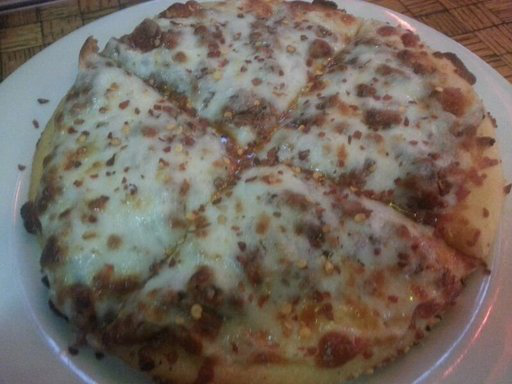

In [11]:
rojak_imgs = list(data_dir.glob('Pizza/*.jpg'))
print(len(rojak_imgs))
PIL.Image.open(rojak_imgs[1])

In [27]:
batch_size = 32
img_height = 180
img_width = 180

train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

train_y = np.concatenate([y for x, y in train_ds], axis=0)

Found 2038 files belonging to 7 classes.
Using 1631 files for training.


In [28]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_y = np.concatenate([y for x, y in val_ds], axis=0)

Found 2038 files belonging to 7 classes.
Using 407 files for validation.


In [14]:
class_names = train_ds.class_names
print(class_names)


['Curry', 'Egg', 'FrenchFries', 'Pizza', 'Roasted Chicken Rice', 'Rojak', 'Steamed Chicken Rice']


<ipython-input-15-a6b502d18491>:4: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.subplot(3, 3, i + 1)


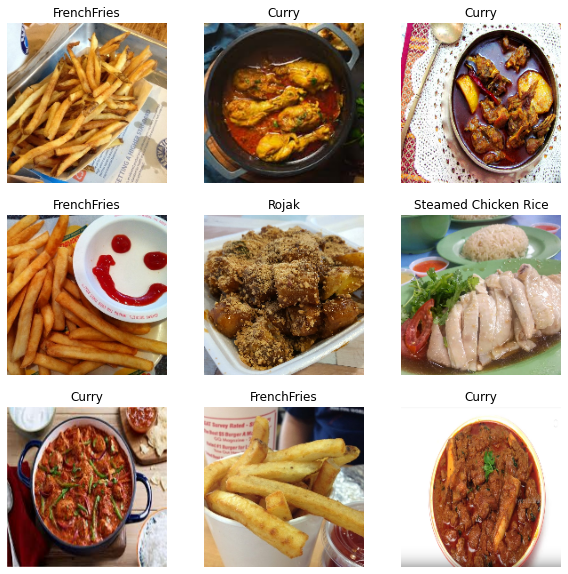

In [15]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(3):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [16]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 180, 180, 3)
(32,)


In [17]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [18]:
normalization_layer = layers.Rescaling(1./255)

In [19]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.0 1.0


In [20]:
num_classes = len(class_names)

data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

# THIS IS Jun Ming Code
#model = Sequential([
#  data_augmentation,
#  layers.Rescaling(1./255),
#  layers.Conv2D(16, 3, padding='same', activation='relu'),
#  layers.MaxPooling2D(),
#  layers.Conv2D(32, 3, padding='same', activation='relu'),
#  layers.MaxPooling2D(),
#  layers.Conv2D(64, 3, padding='same', activation='relu'),
#  layers.MaxPooling2D(),
#  layers.Dropout(0.2),
#  layers.Flatten(),
#  layers.Dense(128, activation='relu'),
#  layers.Dense(num_classes, name="outputs")
#])

model = Sequential()
# input: 28x28 images with 1 channels -> (28, 28, 1) tensors.
# this applies 32 convolution filters of size 3x3 each.
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(180, 180, 3),padding='same'))
model.add(BatchNormalization(momentum=0.9, epsilon=1e-5, gamma_initializer="uniform"))
model.add(LeakyReLU(alpha=0.1))
model.add(Conv2D(32, (3, 3), activation='relu',padding='same'))
model.add(BatchNormalization(momentum=0.9, epsilon=1e-5, gamma_initializer="uniform"))
model.add(LeakyReLU(alpha=0.1))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), activation='relu',padding='same'))
model.add(BatchNormalization(momentum=0.9, epsilon=1e-5, gamma_initializer="uniform"))
model.add(LeakyReLU(alpha=0.1))
model.add(Conv2D(64, (3, 3), activation='relu',padding='same'))
model.add(BatchNormalization(momentum=0.9, epsilon=1e-5, gamma_initializer="uniform"))
model.add(LeakyReLU(alpha=0.1))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))


model.add(Conv2D(128, kernel_size=5, activation='relu',padding='same'))
model.add(BatchNormalization(momentum=0.9, epsilon=1e-5, gamma_initializer="uniform"))
model.add(LeakyReLU(alpha=0.1))
model.add(Conv2D(128, kernel_size=5, activation='relu',padding='same'))
model.add(BatchNormalization(momentum=0.9, epsilon=1e-5, gamma_initializer="uniform"))
model.add(LeakyReLU(alpha=0.1))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))


model.add(Conv2D(256, kernel_size=5, activation='relu',padding='same'))
model.add(BatchNormalization(momentum=0.9, epsilon=1e-5, gamma_initializer="uniform"))
model.add(LeakyReLU(alpha=0.1))
model.add(Conv2D(256, kernel_size=5, activation='relu',padding='same'))
model.add(BatchNormalization(momentum=0.9, epsilon=1e-5, gamma_initializer="uniform"))
model.add(LeakyReLU(alpha=0.1))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))


model.add(Flatten())



#model = keras.applications.inception_v3.InceptionV3(weights= None, include_top=False, input_shape= (28,28,1))
model.add(Dense(256, activation='relu', name='my_dense'))
model.add(Dropout(0.5))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))

In [21]:
from keras.models import Model


layer_name='my_dense'
intermediate_layer_model = Model(inputs=model.input,
                                 outputs=model.get_layer(layer_name).output)

intermediate_layer_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_input (InputLayer)   [(None, 180, 180, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 180, 180, 32)      896       
                                                                 
 batch_normalization (BatchN  (None, 180, 180, 32)     128       
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 180, 180, 32)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 180, 180, 32)      9248      
                                                                 
 batch_normalization_1 (Batc  (None, 180, 180, 32)     128       
 hNormalization)                                             

In [35]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [36]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 180, 180, 32)      896       
                                                                 
 batch_normalization (BatchN  (None, 180, 180, 32)     128       
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 180, 180, 32)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 180, 180, 32)      9248      
                                                                 
 batch_normalization_1 (Batc  (None, 180, 180, 32)     128       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 180, 180, 32)     

In [37]:
from tensorflow.keras.callbacks import ModelCheckpoint

epochs=30

checkpointer = ModelCheckpoint(filepath='./best_model.hdf5', verbose=1, save_best_only=True)

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
    callbacks=[checkpointer]
)

Epoch 1/30


C:\Users\ianch\anaconda3\lib\site-packages\keras\backend.py:5582: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


 2/51 [>.............................] - ETA: 6:05 - loss: 2.0121 - accuracy: 0.1250 

KeyboardInterrupt: 

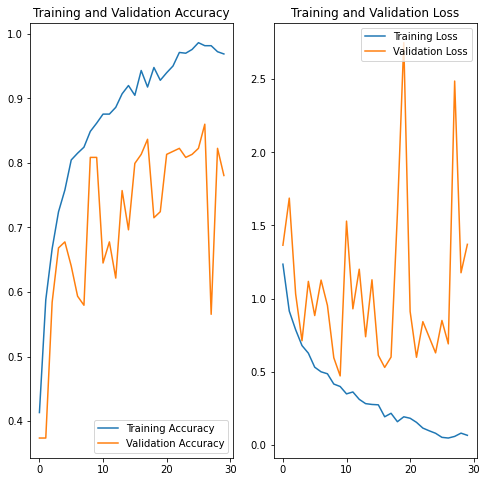

In [66]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [32]:
import pandas as pd

intermediate_output = intermediate_layer_model.predict(train_ds) 
intermediate_output = pd.DataFrame(data=intermediate_output)

intermediate_val_output = intermediate_layer_model.predict(val_ds)
intermediate_val_output = pd.DataFrame(data=intermediate_val_output)


13/13 [==============================] - 22s 2s/step


In [33]:
from xgboost import XGBClassifier

xgbmodel = XGBClassifier(objective='multi:softprob', 
                      num_class= 7)
xgbmodel.fit(intermediate_output, train_y)
xgbmodel.score(intermediate_val_output, val_y)

0.13513513513513514

In [43]:
test_dir = pathlib.Path("test/")
test_imgs = list(test_dir.glob('*.jpg'))
len(test_imgs)

137

In [44]:
img = tf.keras.utils.load_img(
        test_imgs[2], target_size=(img_height, img_width)
    )
img_array = tf.keras.utils.img_to_array(img)
img_array.shape

(180, 180, 3)

1/1 [==============================] - 0s 57ms/step


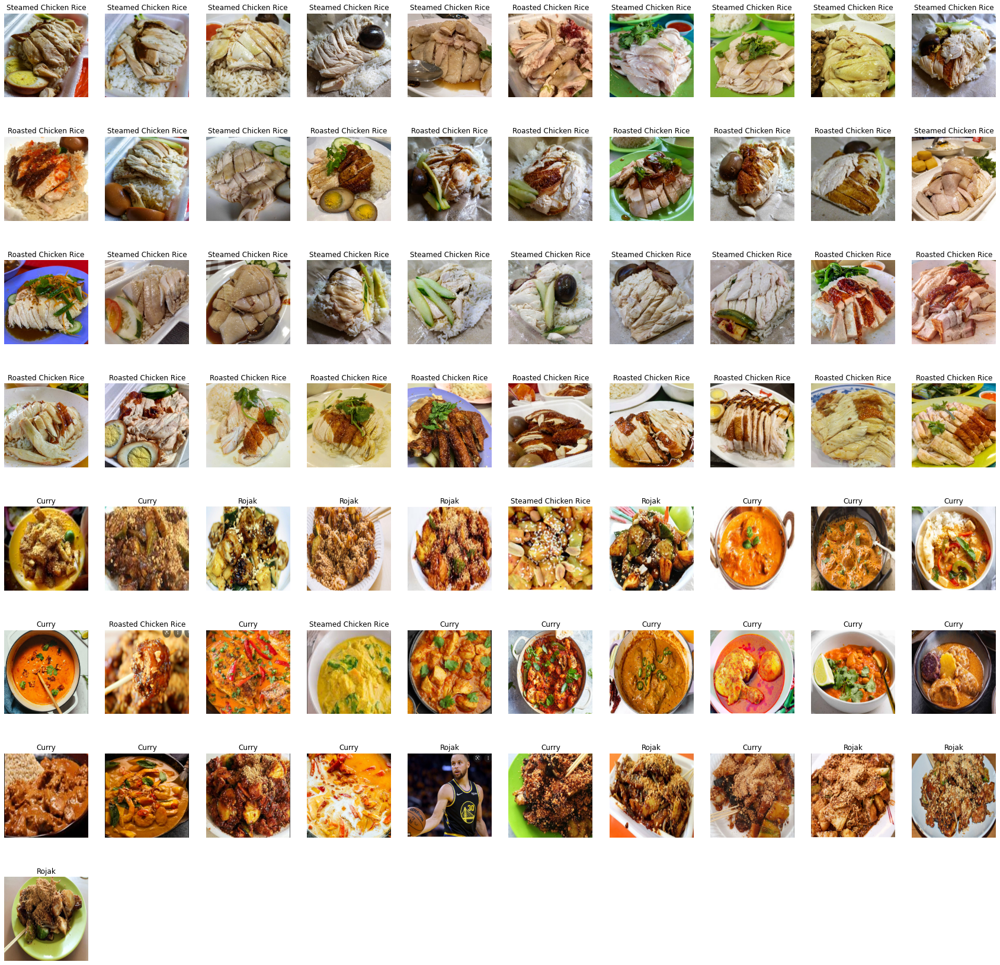

In [69]:
plt.figure(figsize=(30, 30))
for i in range(len(test_imgs)):
    ax = plt.subplot(len(test_imgs) // 10 + 1, 10, i + 1)
    img = tf.keras.utils.load_img(
        test_imgs[i], target_size=(img_height, img_width)
    )
    img_array = tf.keras.utils.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0) # Create a batch
    plt.imshow(img)
    predict = model.predict(img_array)
    score = tf.nn.softmax(predict[0])
    plt.title(format(class_names[np.argmax(score)]))
    plt.axis("off")

In [14]:
model.save('./Model_7Foods_SimpleCNN.hdf5')

NameError: name 'model' is not defined

In [15]:
new_model = tf.keras.models.load_model('Model_4Foods_SimpleCNN.hdf5')

1/1 [==============================] - 0s 78ms/step


Text(0.5, 1.0, 'Curry')

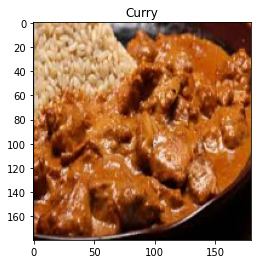

In [20]:
test_dir = pathlib.Path("test/")
test_imgs = list(test_dir.glob('*.jpg'))

img = tf.keras.utils.load_img(test_imgs[60], target_size=(img_height, img_width))

img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

plt.imshow(img)
predict = new_model.predict(img_array)

plt.title(format(class_names[np.argmax(predict)]))